# Problem Statement
The customer always looks forward to specialized treatment, whether shopping on an e-commerce website or watching Netflix. The customer desires content that aligns with their preferences. To maintain customer engagement, companies must consistently provide the most relevant information.
Starting with Spotify, a Swedish audio streaming and media service provider, boasts over 456 million active monthly users, including more than 195 million paid subscribers as of September 2022. The company aims to create cohorts of different songs to enhance song recommendations. These cohorts will be based on various relevant features, ensuring that each group contains similar types of songs.

# Problem Objective
As a data scientist, you should perform exploratory data analysis and cluster analysis to create cohorts of songs. The goal is to better understand the various factors that create a cohort of songs.

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px

In [4]:
df=pd.read_csv("rolling_stones_spotify.csv")

In [5]:
df.describe()

,Unnamed: 0,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
count,1610.000000,1610.000000,1610.000000,1610.000000,1610.000000,1610.000000,1610.00000,1610.000000,1610.000000,1610.000000,1610.000000,1610.000000,1610.000000
mean,804.500000,8.613665,0.250475,0.468860,0.792352,0.164170,0.49173,-6.971615,0.069512,126.082033,0.582165,20.788199,257736.488199
std,464.911282,6.560220,0.227397,0.141775,0.179886,0.276249,0.34910,2.994003,0.051631,29.233483,0.231253,12.426859,108333.474920
min,0.000000,1.000000,0.000009,0.104000,0.141000,0.000000,0.02190,-24.408000,0.023200,46.525000,0.000000,0.000000,21000.000000
25%,402.250000,4.000000,0.058350,0.362250,0.674000,0.000219,0.15300,-8.982500,0.036500,107.390750,0.404250,13.000000,190613.000000
50%,804.500000,7.000000,0.183000,0.458000,0.848500,0.013750,0.37950,-6.523000,0.051200,124.404500,0.583000,20.000000,243093.000000
75%,1206.750000,11.000000,0.403750,0.578000,0.945000,0.179000,0.89375,-4.608750,0.086600,142.355750,0.778000,27.000000,295319.750000
max,1609.000000,47.000000,0.994000,0.887000,0.999000,0.996000,0.99800,-1.014000,0.624000,216.304000,0.974000,80.000000,981866.000000


In [6]:
df.head()

,Unnamed: 0,name,album,release_date,track_number,id,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
0,0,Concert Intro Music - Live,Licked Live In NYC,2022-06-10,1,2IEkywLJ4ykbhi1yRQvmsT,spotify:track:2IEkywLJ4ykbhi1yRQvmsT,0.0824,0.463,0.993,0.996000,0.932,-12.913,0.1100,118.001,0.0302,33,48640
1,1,Street Fighting Man - Live,Licked Live In NYC,2022-06-10,2,6GVgVJBKkGJoRfarYRvGTU,spotify:track:6GVgVJBKkGJoRfarYRvGTU,0.4370,0.326,0.965,0.233000,0.961,-4.803,0.0759,131.455,0.3180,34,253173
2,2,Start Me Up - Live,Licked Live In NYC,2022-06-10,3,1Lu761pZ0dBTGpzxaQoZNW,spotify:track:1Lu761pZ0dBTGpzxaQoZNW,0.4160,0.386,0.969,0.400000,0.956,-4.936,0.1150,130.066,0.3130,34,263160
3,3,If You Can't Rock Me - Live,Licked Live In NYC,2022-06-10,4,1agTQzOTUnGNggyckEqiDH,spotify:track:1agTQzOTUnGNggyckEqiDH,0.5670,0.369,0.985,0.000107,0.895,-5.535,0.1930,132.994,0.1470,32,305880
4,4,Don’t Stop - Live,Licked Live In NYC,2022-06-10,5,7piGJR8YndQBQWVXv6KtQw,spotify:track:7piGJR8YndQBQWVXv6KtQw,0.4000,0.303,0.969,0.055900,0.966,-5.098,0.0930,130.533,0.2060,32,305106


In [7]:
df = df.drop(['Unnamed: 0'], axis=1)

In [8]:
df.columns

Index(['name', 'album', 'release_date', 'track_number', 'id', 'uri',
       'acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity',
       'duration_ms'],
      dtype='object')

In [9]:
print(df.isnull().sum())

name                0
album               0
release_date        0
track_number        0
id                  0
uri                 0
acousticness        0
danceability        0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
duration_ms         0
dtype: int64


In [10]:
df.describe()

,track_number,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
count,1610.000000,1610.000000,1610.000000,1610.000000,1610.000000,1610.00000,1610.000000,1610.000000,1610.000000,1610.000000,1610.000000,1610.000000
mean,8.613665,0.250475,0.468860,0.792352,0.164170,0.49173,-6.971615,0.069512,126.082033,0.582165,20.788199,257736.488199
std,6.560220,0.227397,0.141775,0.179886,0.276249,0.34910,2.994003,0.051631,29.233483,0.231253,12.426859,108333.474920
min,1.000000,0.000009,0.104000,0.141000,0.000000,0.02190,-24.408000,0.023200,46.525000,0.000000,0.000000,21000.000000
25%,4.000000,0.058350,0.362250,0.674000,0.000219,0.15300,-8.982500,0.036500,107.390750,0.404250,13.000000,190613.000000
50%,7.000000,0.183000,0.458000,0.848500,0.013750,0.37950,-6.523000,0.051200,124.404500,0.583000,20.000000,243093.000000
75%,11.000000,0.403750,0.578000,0.945000,0.179000,0.89375,-4.608750,0.086600,142.355750,0.778000,27.000000,295319.750000
max,47.000000,0.994000,0.887000,0.999000,0.996000,0.99800,-1.014000,0.624000,216.304000,0.974000,80.000000,981866.000000


In [11]:
df.dtypes

name                 object
album                object
release_date         object
track_number          int64
id                   object
uri                  object
acousticness        float64
danceability        float64
energy              float64
instrumentalness    float64
liveness            float64
loudness            float64
speechiness         float64
tempo               float64
valence             float64
popularity            int64
duration_ms           int64
dtype: object

In [12]:
#Check duplicates
n_duplicates=df.duplicated().sum()
print("Duplicates",n_duplicates)

## no song duplicates

Duplicates 0


In [13]:
numericcols=df.select_dtypes(include=np.number)
objectcols=df.select_dtypes(include=['object'])
print(numericcols.columns.tolist())
print(objectcols.columns.tolist())

['track_number', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity', 'duration_ms']
['name', 'album', 'release_date', 'id', 'uri']


SKewness Scores:
 track_number        1.777241
acousticness        0.868785
danceability        0.162052
energy             -0.941379
instrumentalness    1.667856
liveness            0.220033
loudness           -0.888034
speechiness         3.230335
tempo               0.361867
valence            -0.195988
popularity          0.883930
duration_ms         1.924778
dtype: float64


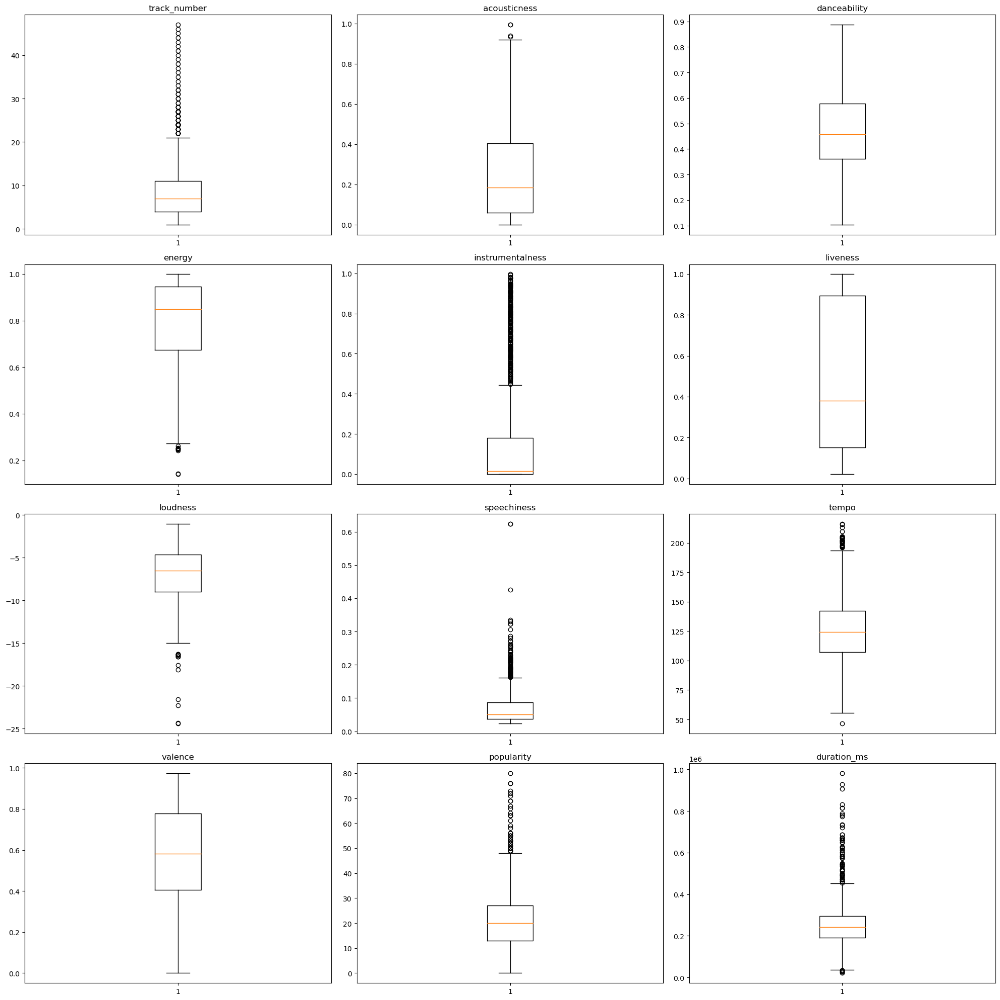

In [14]:
# Checking Outliers
def outlier_checker(numericcols,fig_name):
    '''
        parameter type:positional and the given dataframe must contain numeric data
        This function gives the skewness of the given column and plot the box plot for all the column to check the outliers
    '''
    print("SKewness Scores:\n",numericcols.skew(axis=0))
    # Ploting box plot
    plt.figure(figsize=(20,20))
    for indx,col in enumerate(numericcols):
        plt.subplot(4,3,indx+1)
        plt.title(col)
        plt.boxplot(numericcols[col])
        plt.savefig('Skewness')
    plt.tight_layout()

outlier_checker(numericcols,'box plot1')

#Finding
#Rules of Thumb for Skewness:

#If skewness is less than -1 or greater than 1, the distribution is highly skewed.
#If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed.
#If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.
#The data contains skewed features particularly speechiness, track_number, instrumentalness, and duration_ms

SKewness Scores:
 track_number        0.723256
acousticness        0.846917
danceability        0.162052
energy             -0.895476
instrumentalness    2.731547
liveness            0.220033
loudness           -0.453578
speechiness         1.210777
tempo               0.171440
valence            -0.195988
popularity          0.199920
duration_ms         0.396708
dtype: float64


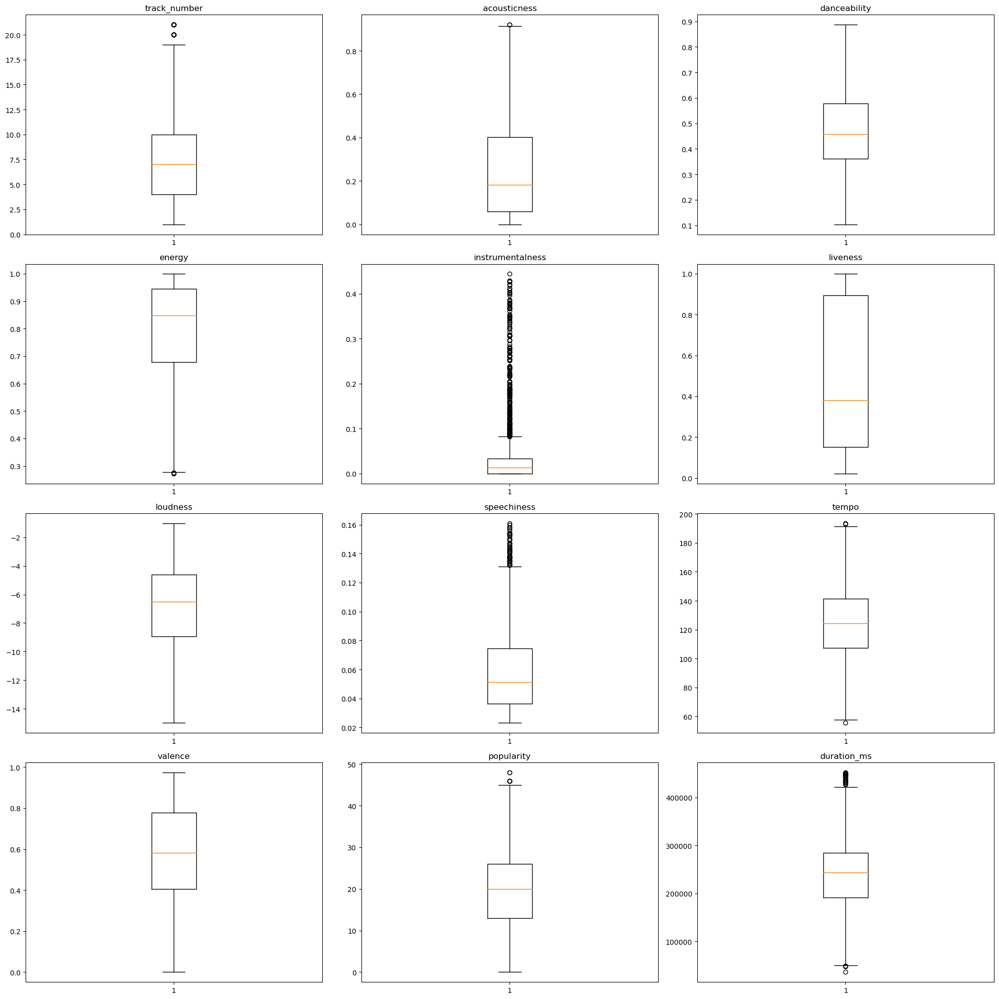

In [15]:
# Detect and remove outliers in numeric columns using IQR method

for column in numericcols:
    # Q1 = numericcols[column].quantile(0.25)
    # Q3 = numericcols[column].quantile(0.75)
    Q1,Q3=np.percentile(numericcols[column],[25,75])
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers=numericcols[column][(numericcols[column]>upper_bound)| (numericcols[column]<lower_bound)]
    numericcols.loc[outliers.index,column]=np.median(numericcols[column])

outlier_checker(numericcols,'boxplot2')

In [16]:
#Utilize suitable visualizations to identify the two albums that should be recommended to anyone based on the number of popular songs in each album
#For this first looking at the data distribution as per popularity column
#75 percent of songs have popularity as 27, so 30 can be a popularity threshold

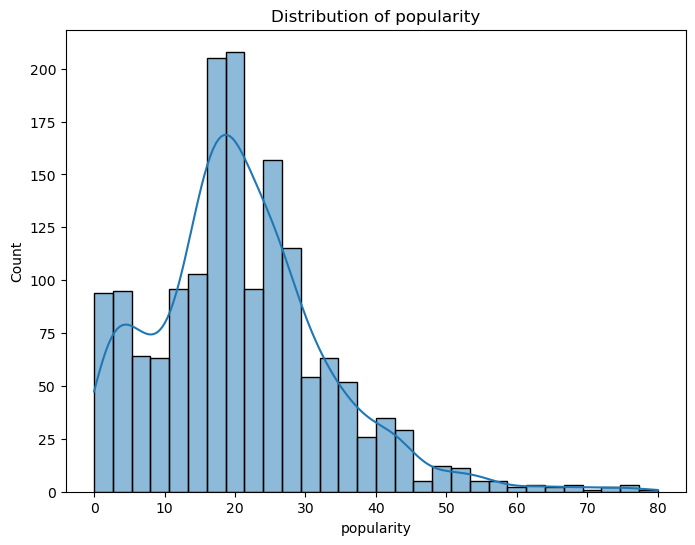

count    1610.000000
mean       20.788199
std        12.426859
min         0.000000
25%        13.000000
50%        20.000000
75%        27.000000
max        80.000000
Name: popularity, dtype: float64

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram for a numerical column
plt.figure(figsize=(8, 6))
sns.histplot(df['popularity'], bins=30, kde=True)
plt.title('Distribution of popularity')
plt.show()

df['popularity'].describe()

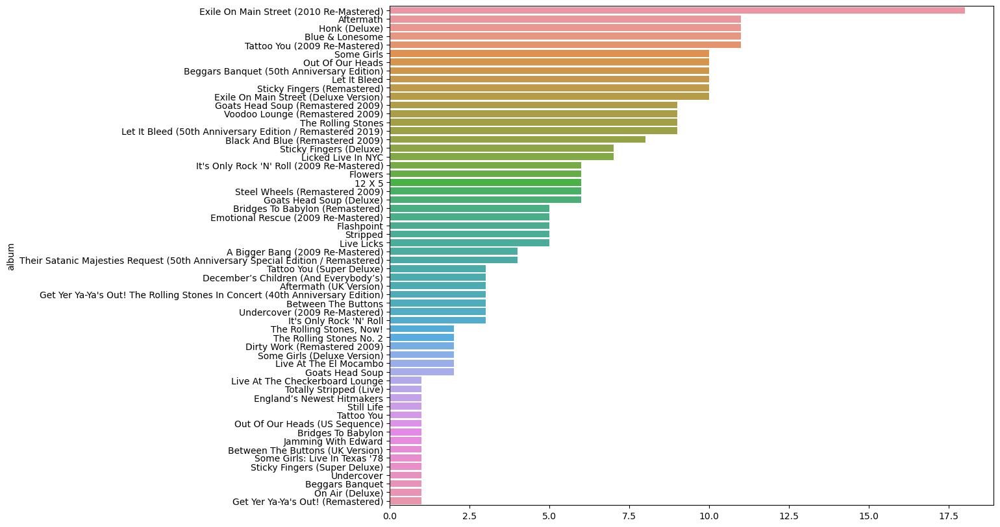

album
Exile On Main Street (2010 Re-Mastered)    18
Aftermath                                  11
Name: count, dtype: int64

In [18]:
# Taking this threshold as per popularity distribution
popularity_threshold = 30

#Tried a threshold of 50 too and that gives lesser songs
# popularity_threshold = 50

# Filter songs that are above the updated popularity threshold
popular_songs = df[df['popularity'] > popularity_threshold]

# Count the number of popular songs per album
popular_songs_per_album = popular_songs['album'].value_counts()
# print(popular_songs_per_album)
# Identify the top 2 albums with the most popular songs based on the new threshold
top_albums = popular_songs_per_album.head(2)

#Plot the number of popular songs per album to visualize the top recommendations
# plt.figure(figsize=(10, 6))
# popular_songs_per_album.plot(kind='bar', color='green')
# plt.title("Number of Popular Songs per Album (Popularity > 30)")
# plt.xlabel("Album")
# plt.ylabel("Number of Popular Songs")
# plt.xticks(rotation=90)
# plt.tight_layout()
# plt.show()
plt.figure(figsize=(12, 10))
sns.barplot(x=popular_songs_per_album.values,y=popular_songs_per_album.index)
plt.show()
# Display the top 2 albums
top_albums

##Top 2 are Exile On Main Street (2010 Re-Mastered) and Aftermath


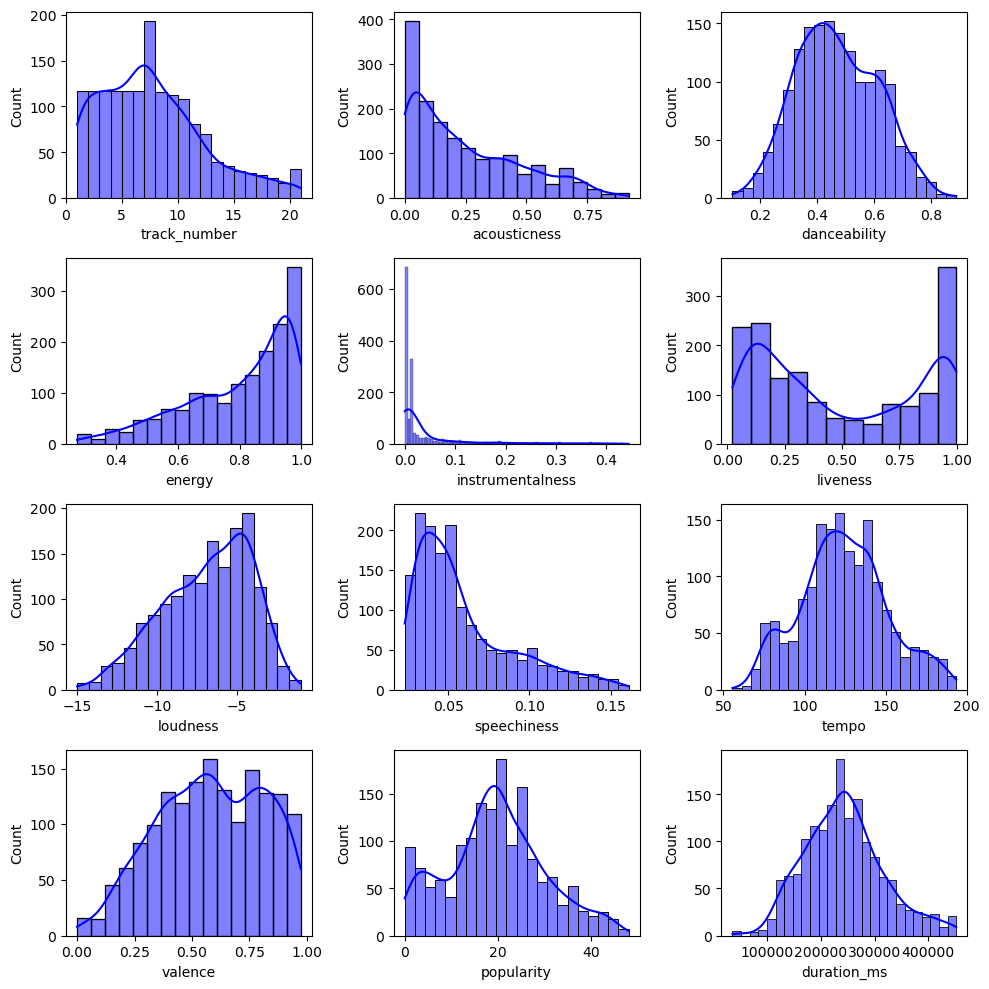

In [19]:
#Data Distribution for numerical features

fig,ax=plt.subplots(4,3,figsize=(10,10))
for col,ax in zip(numericcols.columns,ax.flatten()):
    sns.histplot(numericcols[col],kde=True,color='blue',ax=ax)
#     sns.histplot(song_dat[col],kde=True,color='#16a34a',ax=ax)
plt.tight_layout()
plt.show()

## Findings
The skewed features in this set are primarily acousticness, instrumentalness, liveness, and energy,speechiness and valence due to their right-skewed distributions. 
left skewed

In [21]:
# Data Distribution for all columns for each year
df['release_date']=pd.to_datetime(df['release_date'])
years = df['release_date'].dt.year.unique()

years=np.flip(years)
print(years)
#DF based on year
years_df=[]
for year in years:
    years_df.append(df[df['release_date'].dt.year==year])
#years_df

[1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1976 1977 1978
 1980 1981 1982 1983 1986 1989 1991 1994 1995 1997 2004 2005 2011 2012
 2016 2017 2018 2019 2020 2021 2022]


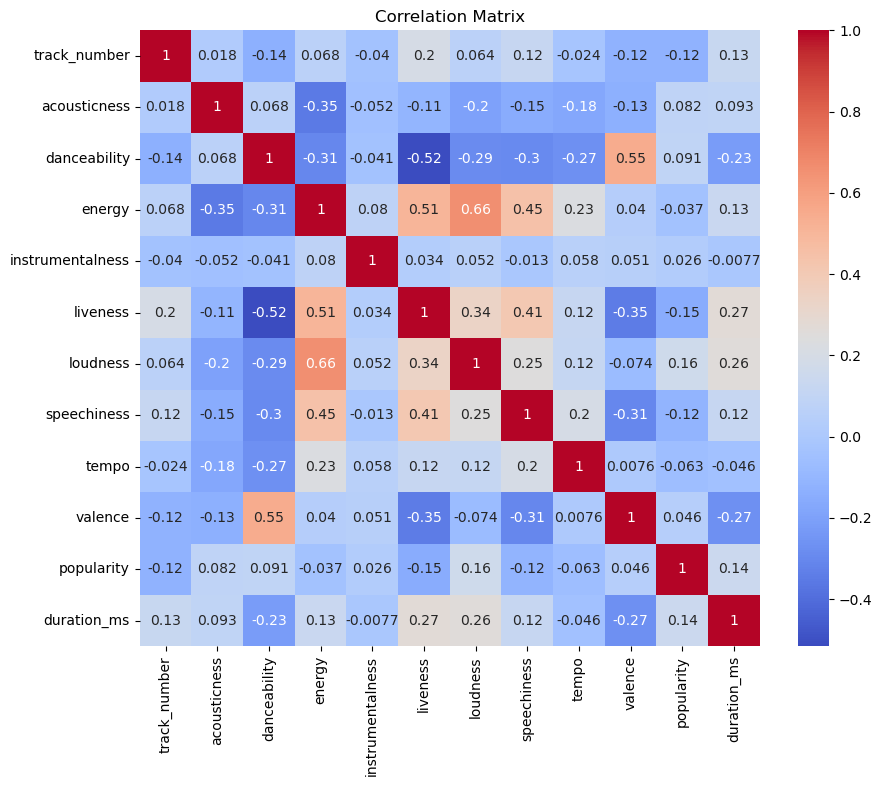

In [22]:
# Correlation matrix for numerical variables
plt.figure(figsize=(10, 8))

sns.heatmap(numericcols.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

## Findings from correlation matrix
- High correlation between energy and loudness: The correlation value is approximately 0.7, indicating a strong positive relationship. This suggests that songs with higher energy tend to have higher loudness levels.

- High correlation between valence and danceability: The correlation value is approximately 0.55, which is a moderate positive correlation. This suggests that songs with higher valence (happiness or positivity) are also more danceable.

- High correlation between energy and loudness

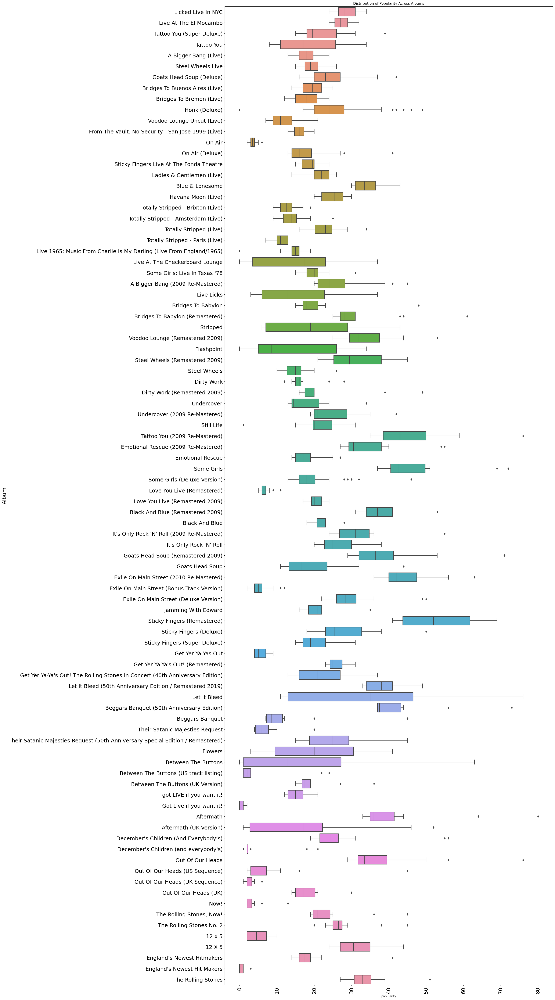

In [24]:
# Box Plot of Popularity Across Albums
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20, 60))
sns.boxplot(x='popularity', y='album', data=df)
plt.xticks(fontsize=18)  # Adjust font size for x-axis labels
plt.yticks(fontsize=18)               # Adjust font size for y-axis labels
plt.xticks(rotation=90)  # Rotate album names for readability
plt.title('Distribution of Popularity Across Albums')
# plt.xlabel('Popularity',fontsize=16)
plt.ylabel('Album',fontsize=18)
plt.show()


Index(['track_number', 'acousticness', 'danceability', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence', 'duration_ms'],
      dtype='object')


C:\Users\chhahee\AppData\Local\Temp\1\ipykernel_21040\1626521230.py:20: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


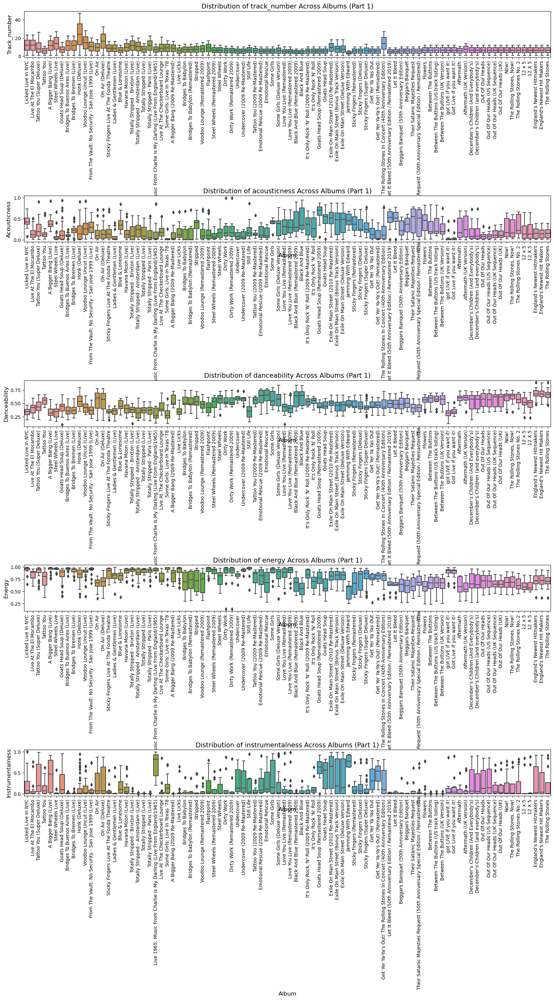

C:\Users\chhahee\AppData\Local\Temp\1\ipykernel_21040\1626521230.py:20: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


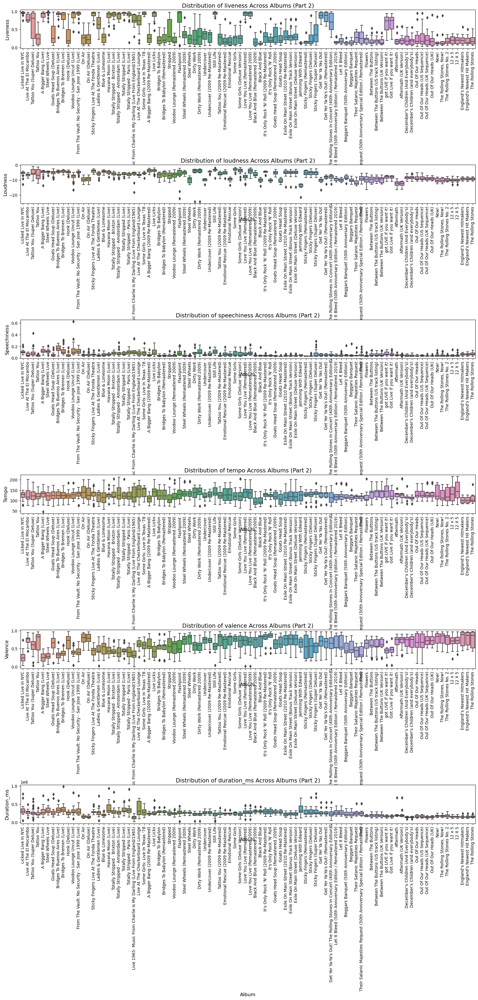

In [25]:
# Select numerical columns and exclude 'popularity'
numerical_features = df.select_dtypes(include=['number']).columns.drop('popularity')
print(numerical_features)

# Split the numerical features into two halves
halfway = len(numerical_features) // 2
features_part1 = numerical_features[:halfway]
features_part2 = numerical_features[halfway:]

# Function to create box plots for a given list of features
def plot_boxplots(features, title_suffix):
    plt.figure(figsize=(20, len(features) * 6))
    for i, feature in enumerate(features, 1):
        plt.subplot(len(features), 1, i)
        sns.boxplot(x='album', y=feature, data=df)
        plt.xticks(rotation=90, fontsize=10)  # Rotate x-axis labels for readability
        plt.title(f'Distribution of {feature} Across Albums {title_suffix}', fontsize=14)
        plt.xlabel('Album', fontsize=12)
        plt.ylabel(feature.capitalize(), fontsize=12)
    plt.tight_layout()
    plt.subplots_adjust(hspace=3.0)  # Add space between plots
    plt.show()

# Plot the first half of the features
plot_boxplots(features_part1, "(Part 1)")

# Plot the second half of the features
plot_boxplots(features_part2, "(Part 2)")

# Loop through each numerical feature and create a box plot for each
# plt.figure(figsize=(30, len(numerical_features) * 5))  # Adjust figure size based on the number of features
# for i, feature in enumerate(numerical_features, 1):
#     plt.subplot(len(numerical_features), 1, i)
#     sns.boxplot(x='album', y=feature, data=df)
#     plt.xticks(rotation=90, fontsize=14)  # Rotate x-axis labels for readability
#     plt.title(f'Distribution of {feature} Across Albums', fontsize=14)
#     plt.xlabel('Album', fontsize=14)
#     plt.ylabel(feature.capitalize(), fontsize=12)
    
# plt.tight_layout()
# plt.subplots_adjust(hspace=3.0)  # Add extra space between subplots
# plt.show()

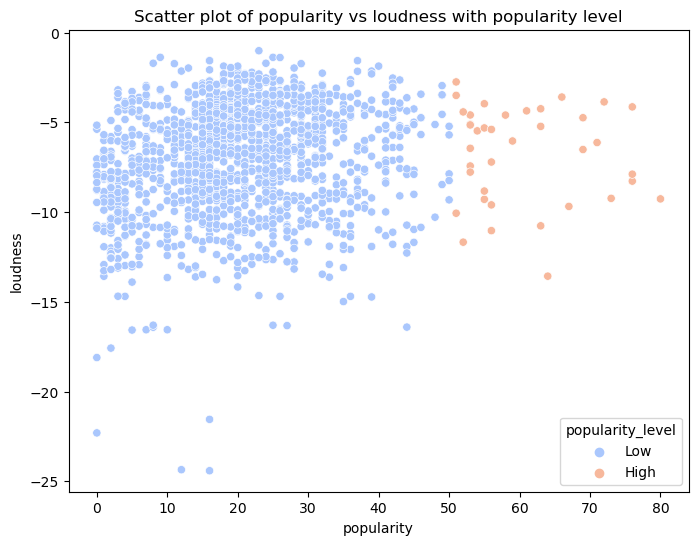

In [26]:
# Create a new categorical variable based on popularity
df['popularity_level'] = ['High' if x > 50 else 'Low' for x in df['popularity']]

plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['popularity'], y=df['loudness'], hue=df['popularity_level'], palette='coolwarm')
plt.title('Scatter plot of popularity vs loudness with popularity level')
plt.show()

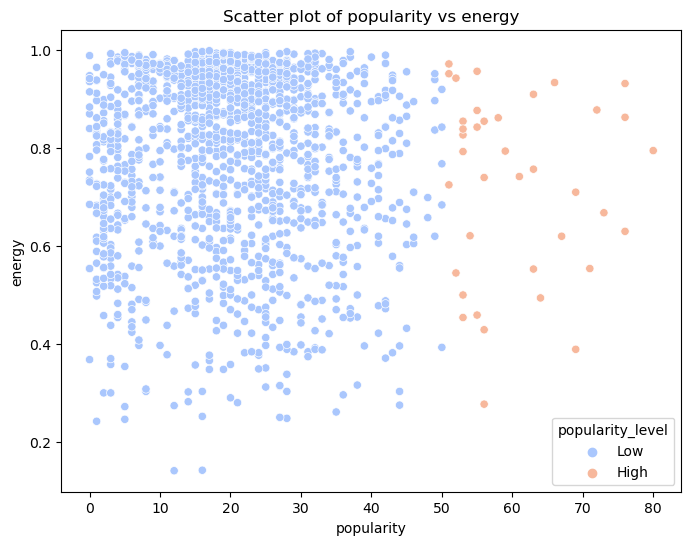

In [27]:
# Scatter plot for two numerical variables
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['popularity'], y=df['energy'],hue=df['popularity_level'], palette='coolwarm')
plt.title('Scatter plot of popularity vs energy')
plt.show()

## Yearly data to check which features correlate to popularity and how things change over time.

### Relation between acousticness and popularity over time.

- no strong correlation. The points are spread out without a clear trend line, suggesting that a song's acousticness level doesn't directly correlate with its popularity.

- Recent years(post 2000s) acousticness is in lower values suggesting trend towards less acoustic sounding music

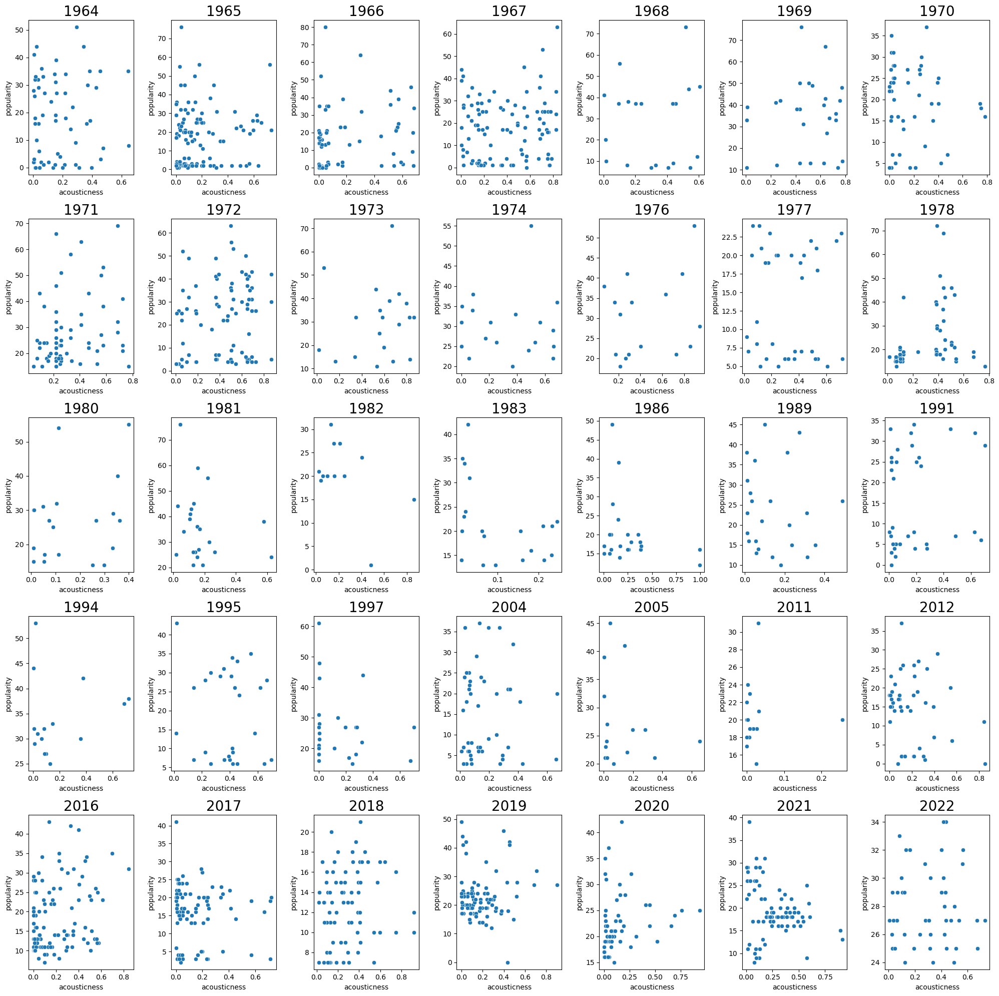

In [30]:
fig,ax=plt.subplots(5,7,figsize=(20,20))
for year,az in zip(years,ax.flatten()):
    tmp_df=df[df['release_date'].dt.year==year]
    sns.scatterplot(data=tmp_df,x='acousticness',y='popularity',ax=az)
    az.set_title(year,fontsize=20)
plt.tight_layout()
plt.show()

### Relation between danceability and popularity over time.
- Lower danceability in 60s indicates less focus on dance oriented styles
- 1977 seems like an outlier in 70s as popularity seemed to go up on danceability
- 80s again not much of a pattern
- 91 again popularity increased with high danceability
- Danceability increased over time, especially from the 2000s onward, reflecting modern pop and electronic influences.

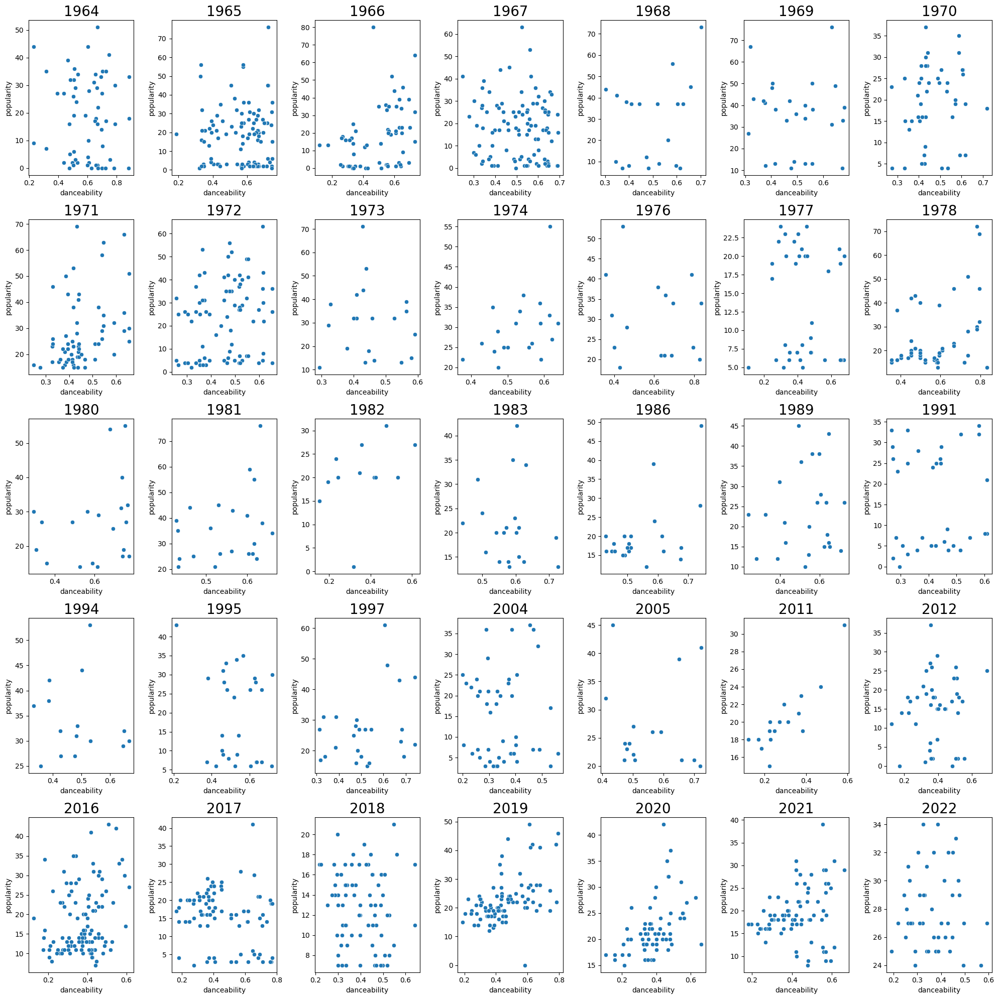

In [32]:
fig,ax=plt.subplots(5,7,figsize=(20,20))
for year,az in zip(years,ax.flatten()):
    tmp_df=df[df['release_date'].dt.year==year]
    sns.scatterplot(data=tmp_df,x='danceability',y='popularity',ax=az)
    az.set_title(year,fontsize=20)
plt.tight_layout()
plt.show()

## Relation between energy and popularity over time.
- do not see much of a trend in 60s and 70s,high energy songs were not too popular, 1970,1972 seem outliers though
- 1991, high energy songs were popular
- Popularity grew with energy level in the 2000s

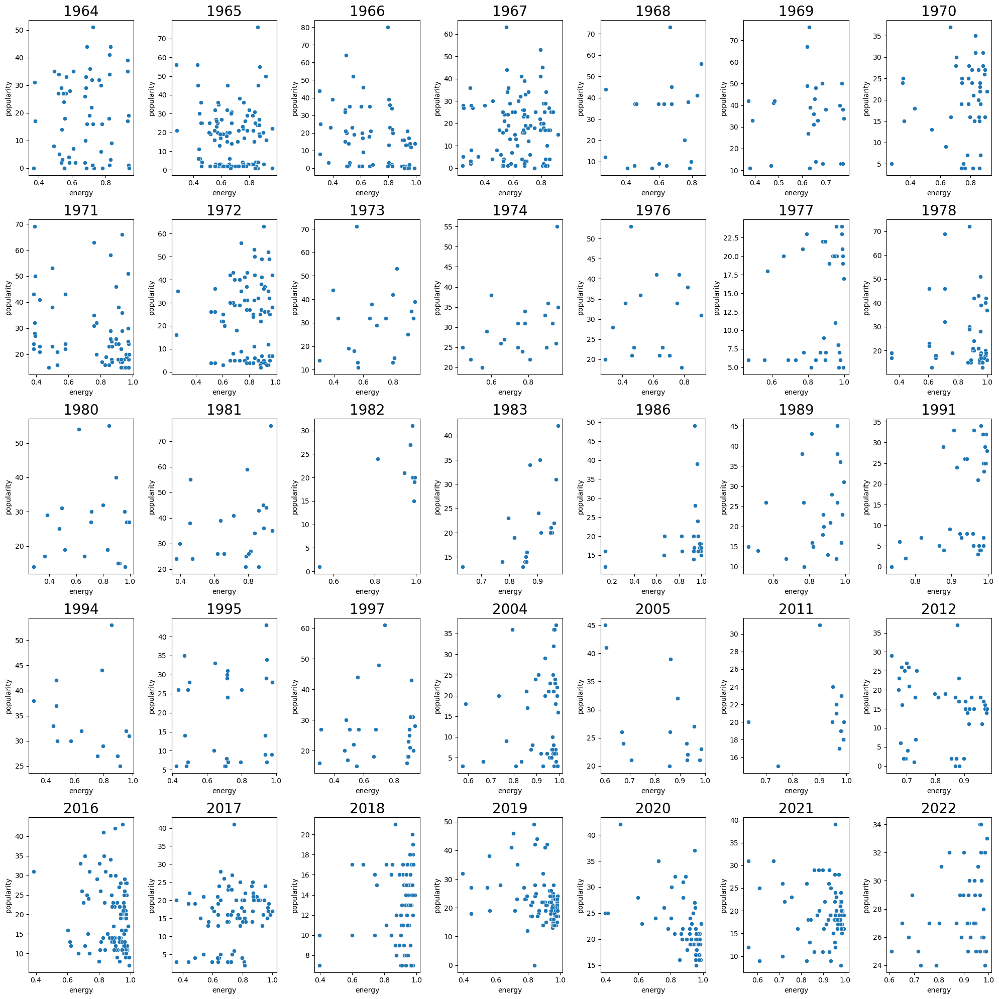

In [34]:
fig,ax=plt.subplots(5,7,figsize=(20,20))
for year,az in zip(years,ax.flatten()):
    tmp_df=df[df['release_date'].dt.year==year]
    sns.scatterplot(data=tmp_df,x='energy',y='popularity',ax=az)
    az.set_title(year,fontsize=20)

plt.tight_layout()
plt.show()

## Relation between instrumentalness and popularity over time.
- Popularity of instrumental music mostly seems low in most years
- 1970,1972 popularity grew for instrumental songs
- in 2000s instrumental music has lost popularity

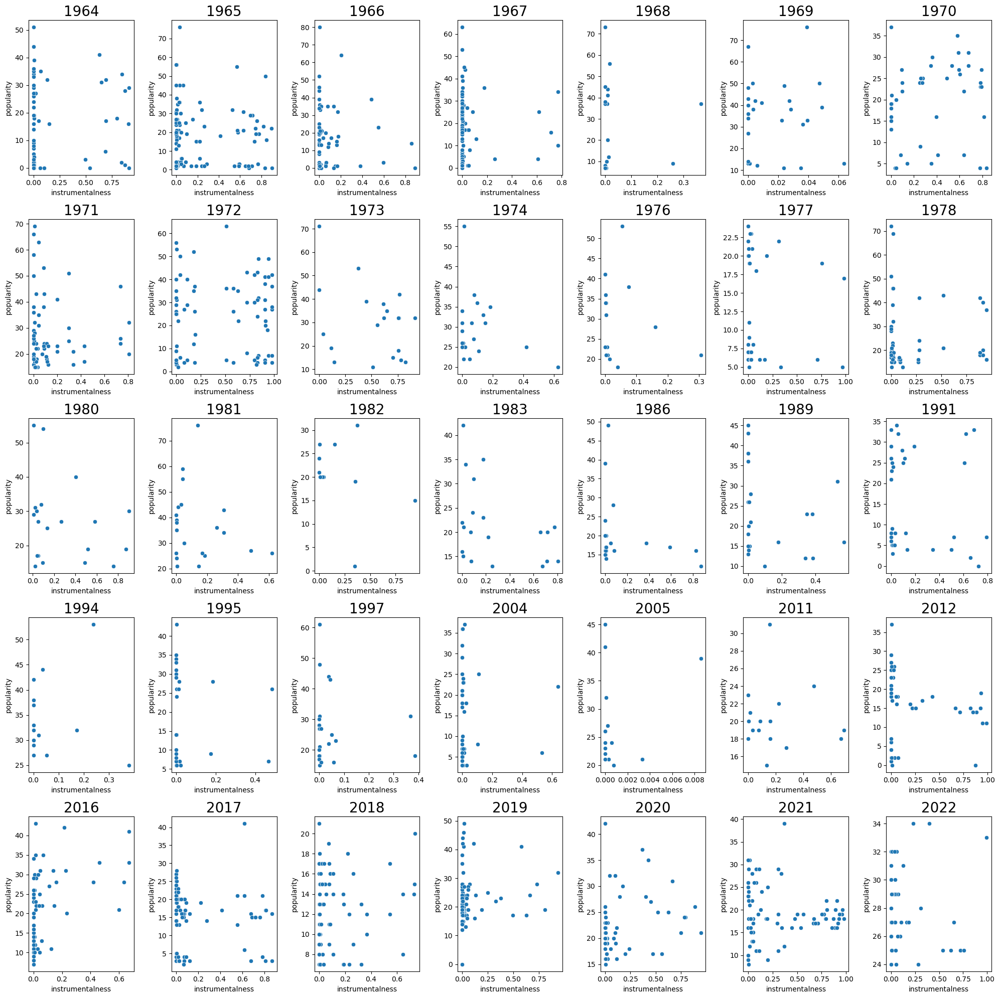

In [36]:
fig,ax=plt.subplots(5,7,figsize=(20,20))
for year,az in zip(years,ax.flatten()):
    tmp_df=df[df['release_date'].dt.year==year]
    sns.scatterplot(data=tmp_df,x='instrumentalness',y='popularity',ax=az)
    az.set_title(year,fontsize=20)

plt.tight_layout()
plt.show()

## Relation between liveness and popularity over time.

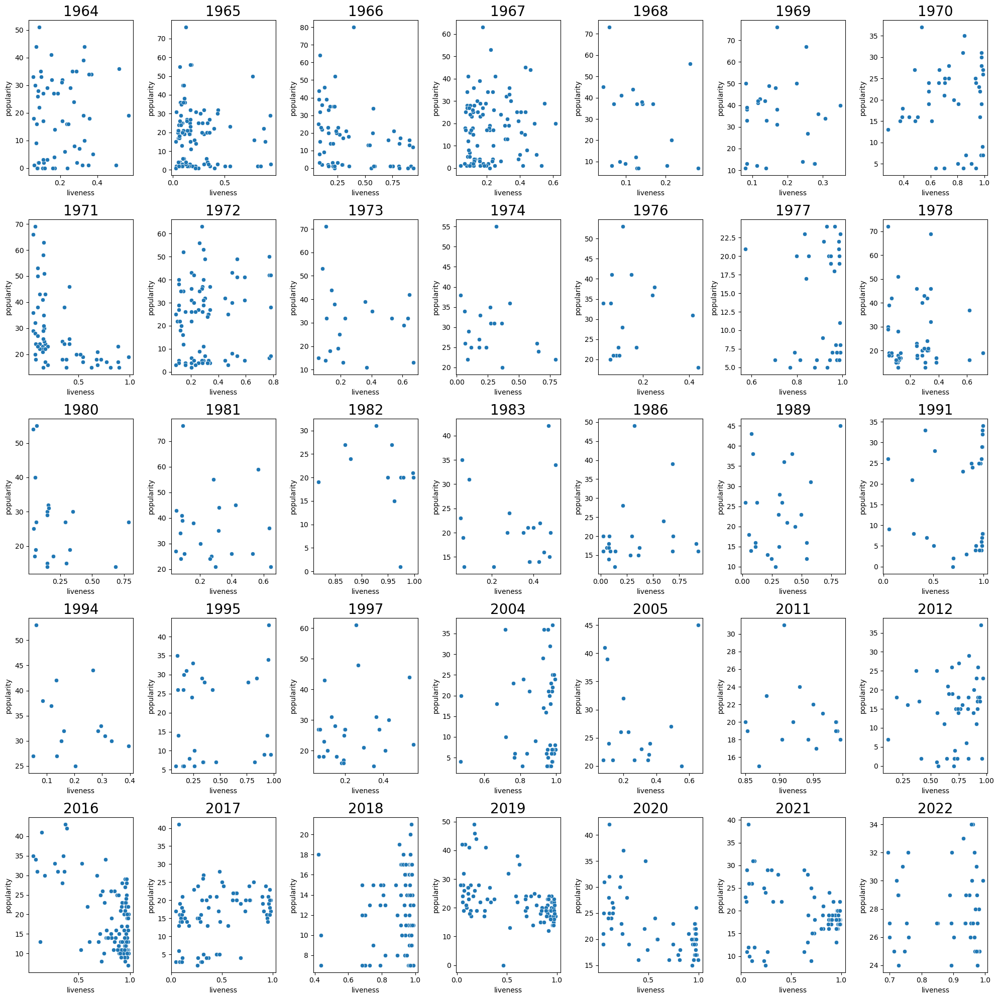

In [38]:
fig,ax=plt.subplots(5,7,figsize=(20,20))
for year,az in zip(years,ax.flatten()):
    tmp_df=df[df['release_date'].dt.year==year]
    sns.scatterplot(data=tmp_df,x='liveness',y='popularity',ax=az)
    az.set_title(year,fontsize=20)

plt.tight_layout()
plt.show()

## Relation between loudness and popularity over time. 
- 60s-80s more negative loudness, means quieter tracks
- 2022 seems off trend, quieter tracks more popular otherwise 2000s loud tracks are popular in 2000s

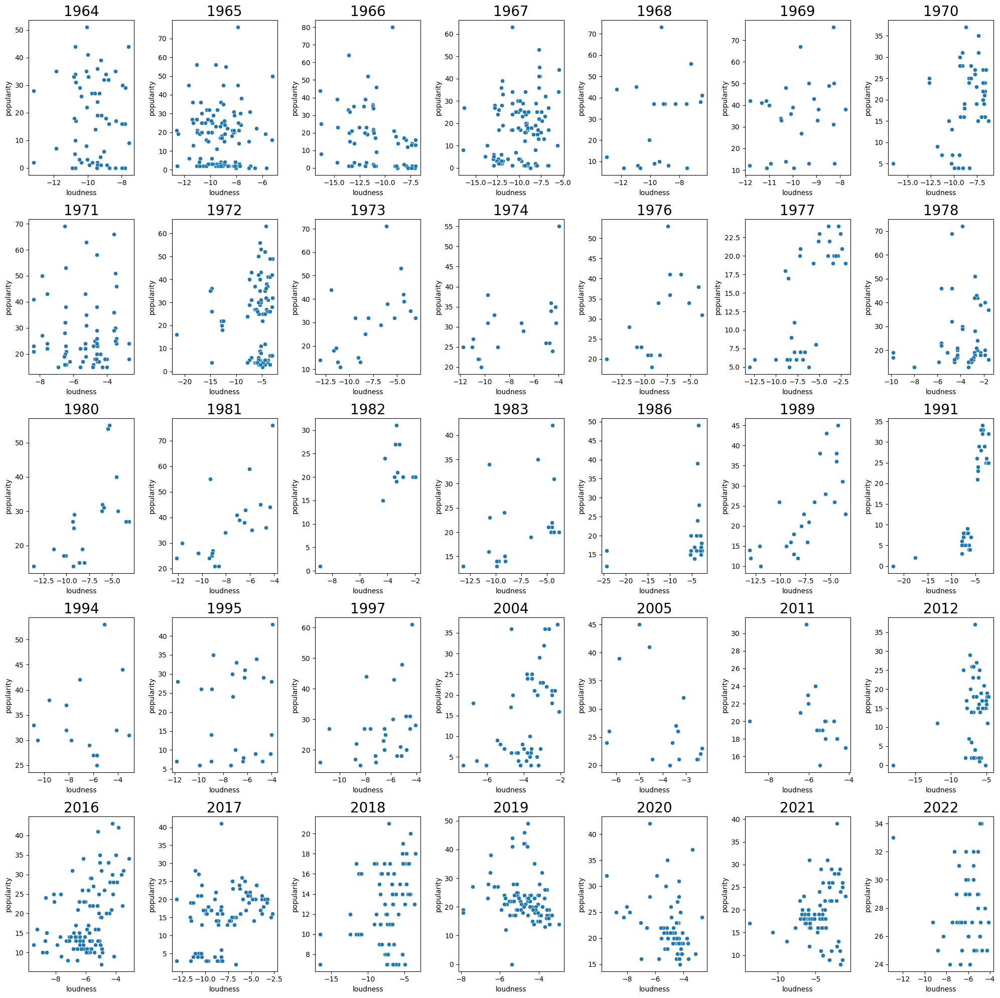

In [40]:
fig,ax=plt.subplots(5,7,figsize=(20,20))
for year,az in zip(years,ax.flatten()):
    tmp_df=df[df['release_date'].dt.year==year]
    sns.scatterplot(data=tmp_df,x='loudness',y='popularity',ax=az)
    az.set_title(year,fontsize=20)

plt.tight_layout()
plt.show()

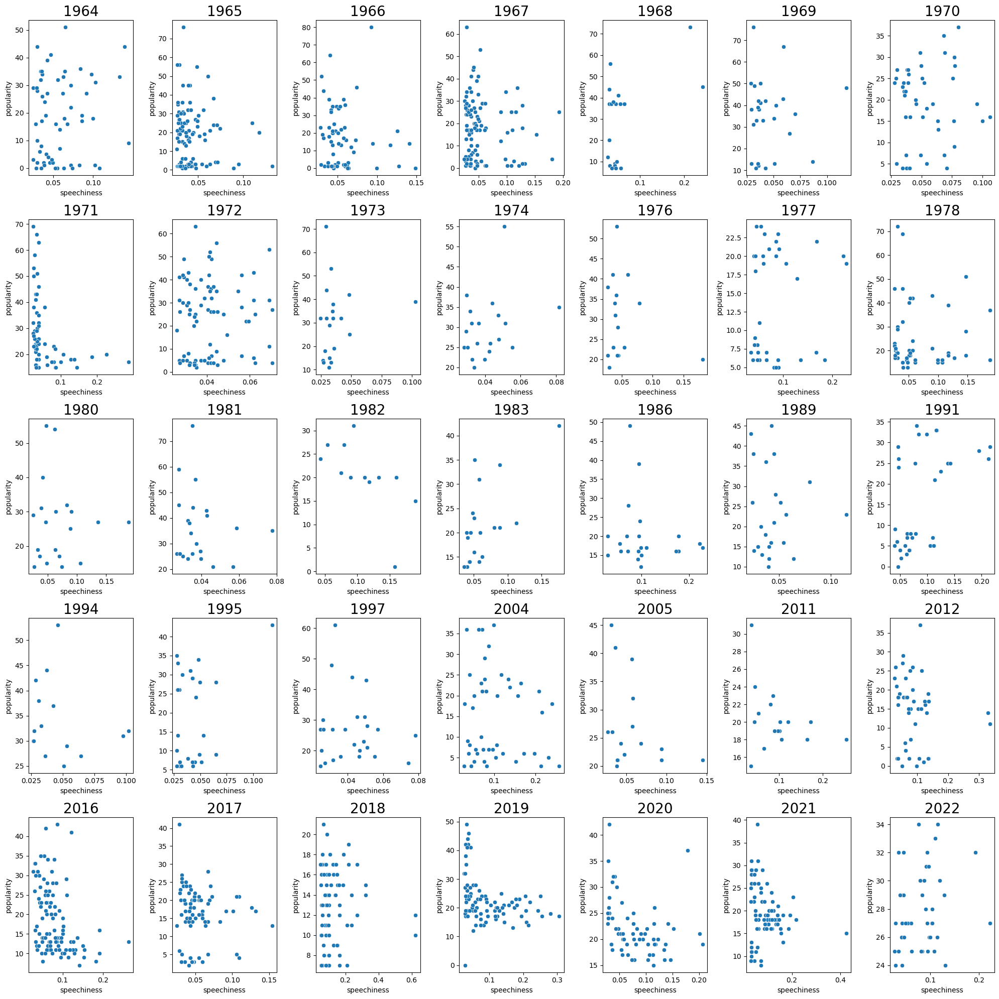

In [41]:
fig,ax=plt.subplots(5,7,figsize=(20,20))
for year,az in zip(years,ax.flatten()):
    tmp_df=df[df['release_date'].dt.year==year]
    sns.scatterplot(data=tmp_df,x='speechiness',y='popularity',ax=az)
    az.set_title(year,fontsize=20)

plt.tight_layout()
plt.show()

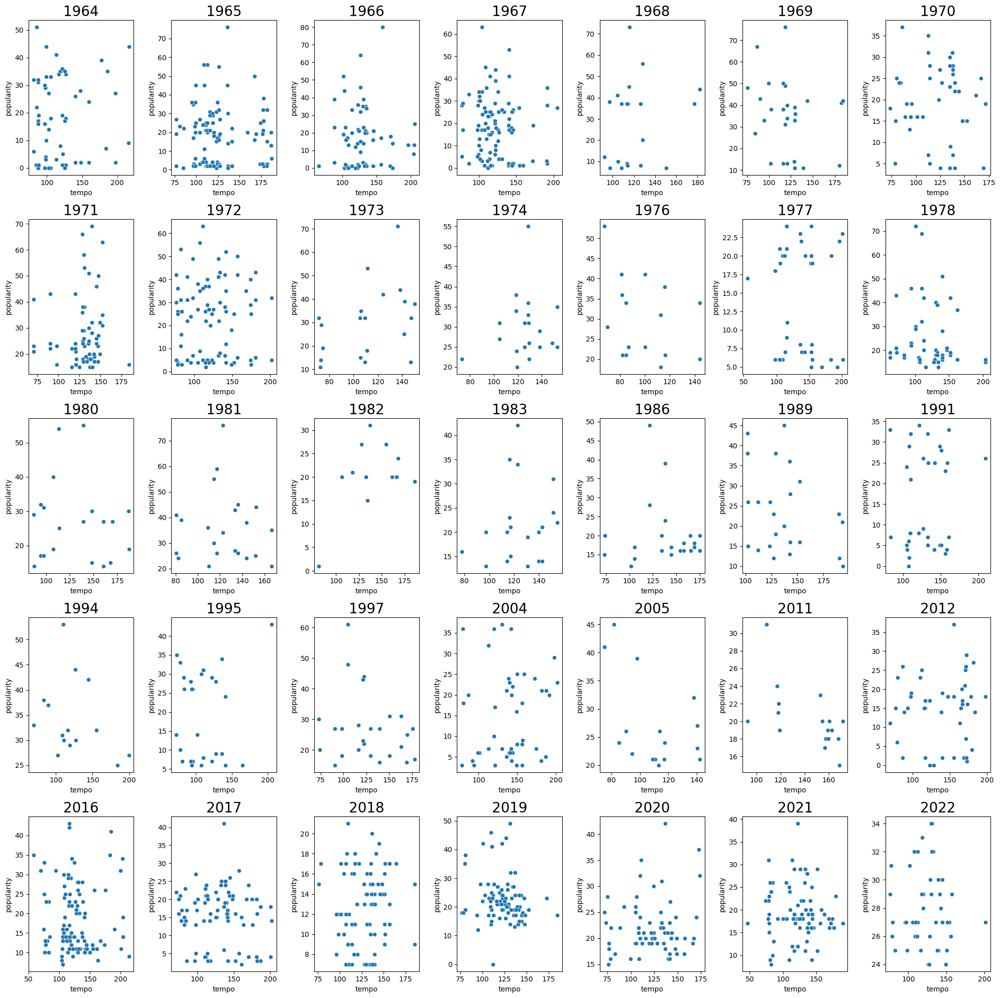

In [42]:
fig,ax=plt.subplots(5,7,figsize=(20,20))
for year,az in zip(years,ax.flatten()):
    tmp_df=df[df['release_date'].dt.year==year]
    sns.scatterplot(data=tmp_df,x='tempo',y='popularity',ax=az)
    az.set_title(year,fontsize=20)

plt.tight_layout()
plt.show()

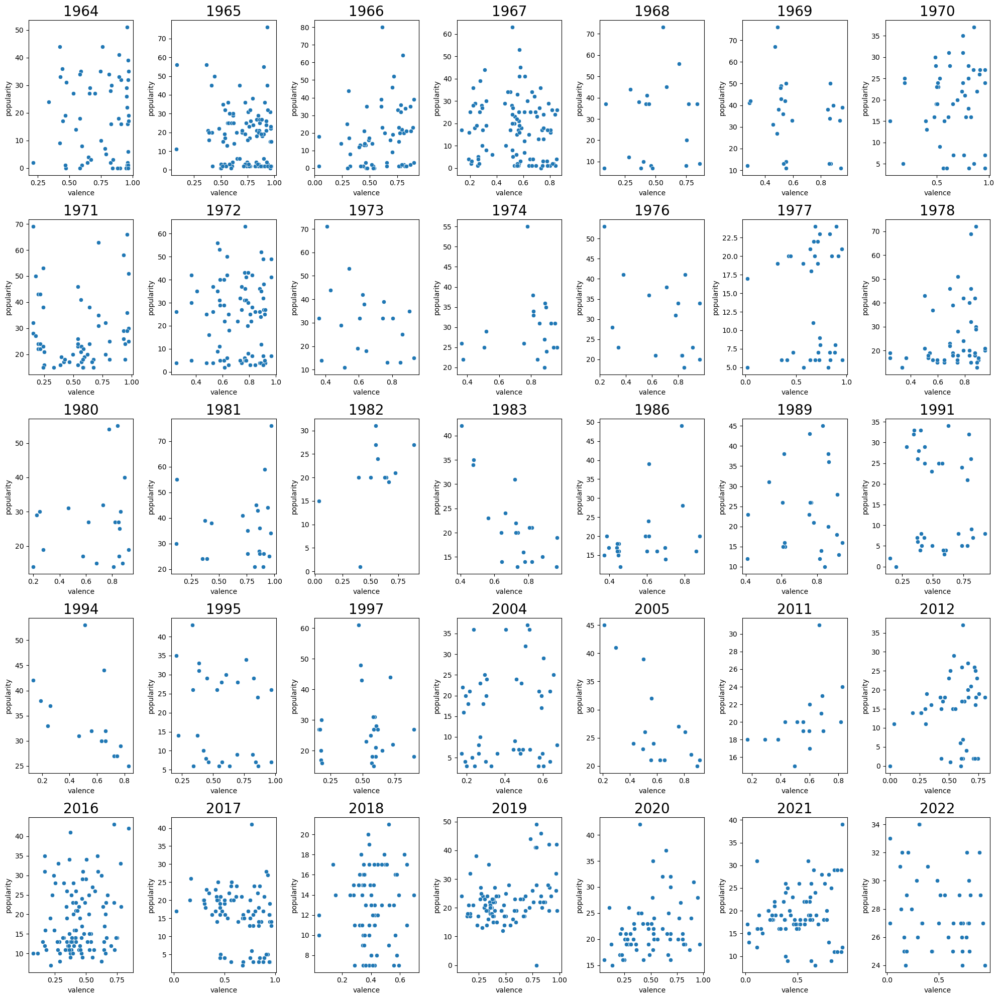

In [43]:
fig,ax=plt.subplots(5,7,figsize=(20,20))
for year,az in zip(years,ax.flatten()):
    tmp_df=df[df['release_date'].dt.year==year]
    sns.scatterplot(data=tmp_df,x='valence',y='popularity',ax=az)
    az.set_title(year,fontsize=20)

plt.tight_layout()
plt.show()

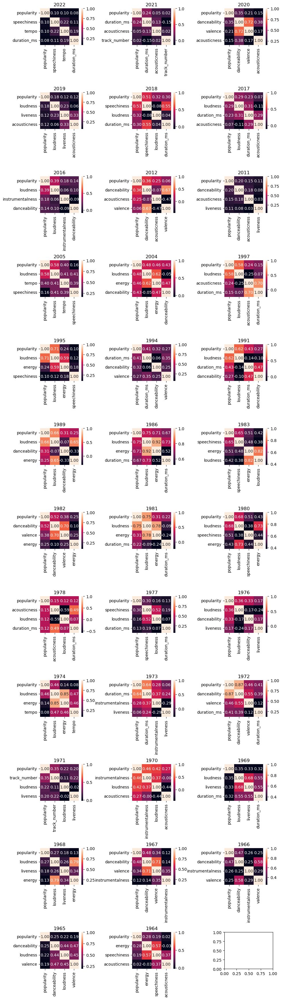

In [44]:
fig,ax=plt.subplots(12,3,figsize=(10,35))
for indx,year_ax in enumerate(zip(np.flip(years),ax.flatten())):
    numeric_df = years_df[indx].select_dtypes(include=['number'])
    cols = numeric_df.corr().nlargest(4, 'popularity')['popularity'].index
    cm = np.corrcoef(years_df[indx][cols].values.T)
#     plotting the heatmap
    year_ax[1].set_title(year_ax[0])
    sns.heatmap(cm, cbar=True, annot=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values,ax=year_ax[1])
plt.tight_layout()
plt.show()




In [45]:
corelation_arr=[]
print("Features That are coorelated with the popularity for different years")
print("--------------------------------------------------------------------")
for indx,year in enumerate(np.flip(years)):
    numeric_df = years_df[indx].select_dtypes(include=['number'])
    cols = numeric_df.corr().nlargest(4, 'popularity')['popularity'].index
    cm = np.corrcoef(years_df[indx][cols].values.T)
    for col in cols[1:]:
        corelation_arr.append(col)
    print(year,cols.values[1:])



Features That are coorelated with the popularity for different years
--------------------------------------------------------------------
2022 ['speechiness' 'tempo' 'duration_ms']
2021 ['duration_ms' 'acousticness' 'track_number']
2020 ['danceability' 'valence' 'acousticness']
2019 ['loudness' 'liveness' 'acousticness']
2018 ['speechiness' 'loudness' 'duration_ms']
2017 ['loudness' 'duration_ms' 'acousticness']
2016 ['loudness' 'instrumentalness' 'danceability']
2012 ['danceability' 'acousticness' 'valence']
2011 ['danceability' 'acousticness' 'liveness']
2005 ['loudness' 'tempo' 'speechiness']
2004 ['loudness' 'energy' 'danceability']
1997 ['loudness' 'acousticness' 'duration_ms']
1995 ['loudness' 'energy' 'speechiness']
1994 ['duration_ms' 'danceability' 'valence']
1991 ['loudness' 'duration_ms' 'danceability']
1989 ['loudness' 'danceability' 'energy']
1986 ['loudness' 'energy' 'duration_ms']
1983 ['speechiness' 'energy' 'loudness']
1982 ['danceability' 'valence' 'energy']
1981 ['lo

In [46]:
df=pd.DataFrame(corelation_arr)
df.value_counts()
## Overall loudness is more related to popularity of a song
## Other findings that make song popular
##1. danceability and energy are some more imp features that make song popular


loudness            23
danceability        14
duration_ms         14
energy              11
acousticness        10
speechiness          8
valence              8
liveness             7
instrumentalness     5
tempo                3
track_number         2
Name: count, dtype: int64

## Provide insights on the significance of dimensionality reduction techniques. Share your ideas and elucidate your observations

As the number of features in our data increases, traditional analysis methods suffer from the "curse of dimensionality." This means models require more data, become computationally expensive, and are prone to overfitting. Dimensionality reduction alleviates this by condensing the information into a lower-dimensional space while preserving the essential patterns.

Pca is mostly commonly used dimensionality reduction technique to reduce the number of features when we have a dataset with large number of features.

In [49]:
drop_cols=['track_number','name','album','release_date','id','uri']

In [50]:
song_dat=pd.read_csv("rolling_stones_spotify.csv")
song_dat=song_dat.drop(drop_cols,axis=1)

In [51]:
#Scaling the data
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
song_dat_scaled=MinMaxScaler().fit_transform(song_dat)
song_dat_scaled=pd.DataFrame(song_dat_scaled,columns=song_dat.columns)
song_dat_scaled.head()
song_dat_scaled.drop(['Unnamed: 0'],axis=1)

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms
0,0.082889,0.458493,0.993007,1.000000,0.932384,0.491365,0.144474,0.420994,0.031006,0.4125,0.028766
1,0.439633,0.283525,0.960373,0.233936,0.962094,0.838035,0.087716,0.500239,0.326489,0.4250,0.241629
2,0.418506,0.360153,0.965035,0.401606,0.956972,0.832350,0.152796,0.492057,0.321355,0.4250,0.252023
3,0.570419,0.338442,0.983683,0.000107,0.894478,0.806745,0.282623,0.509303,0.150924,0.4000,0.296483
4,0.402409,0.254151,0.965035,0.056124,0.967216,0.825425,0.116178,0.494808,0.211499,0.4000,0.295677
...,...,...,...,...,...,...,...,...,...,...,...
1605,0.157940,0.462324,0.921911,0.006195,0.309497,0.649483,0.032790,0.770502,0.992813,0.4875,0.138500
1606,0.057939,0.517241,0.658508,0.000002,0.506198,0.640378,0.101698,0.444637,0.457906,0.4500,0.233400
1607,0.373234,0.876117,0.737762,0.000000,0.046102,0.703044,0.081225,0.297504,0.857290,0.3750,0.161396
1608,0.218303,0.761175,0.472028,0.000070,0.147628,0.634393,0.064913,0.330483,0.546201,0.3375,0.104780


In [52]:
#We then compute the number of dimensions required to maintain 95% variance
pca=PCA(n_components=0.95)
result_arr=pca.fit_transform(song_dat_scaled)
explained_variance = pca.explained_variance_ratio_
print("Explained variance by each component:", explained_variance)
# Find the number of columns
n_cols=result_arr.shape[1]
print(n_cols)

Explained variance by each component: [0.36803518 0.14547251 0.12700933 0.09491262 0.07471356 0.05418169
 0.04396717 0.03438788 0.02201041]
9


In [53]:
# Generating the column name for the PCA dataframe
pca_df = pd.DataFrame(data=result_arr, columns=[f'PC{i+1}' for i in range(result_arr.shape[1])])

In [54]:
pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,0.721036,0.561864,0.535715,-0.201706,-0.303563,-0.364074,0.114036,0.161739,0.326374
1,0.737231,-0.034616,0.221543,-0.242769,0.044997,0.131011,0.075429,0.076143,0.021688
2,0.724148,0.111946,0.282886,-0.262875,0.034541,0.081216,0.089023,0.080783,0.105742
3,0.730633,-0.323075,0.256706,-0.273193,0.025456,0.203608,0.107664,-0.058858,0.170924
4,0.787355,-0.227882,0.173200,-0.209344,-0.014280,0.112494,0.100700,0.038461,0.035446


C:\Users\chhahee\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(
C:\Users\chhahee\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(
C:\Users\chhahee\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(
C:\Users\chhahee\AppData\Roaming\Python\Python311\site-packages\sklearn\c

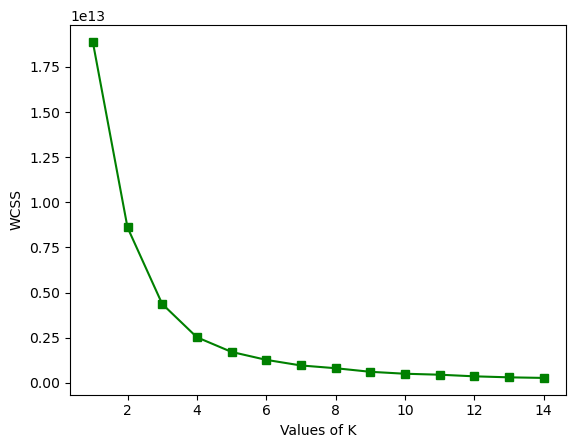

In [55]:
from sklearn.cluster import KMeans
wcss={}

for i in range(1,15):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=1)
    kmeans.fit(song_dat)
    wcss[i]=kmeans.inertia_

plt.plot(wcss.keys(),wcss.values(),'gs-')
plt.xlabel('Values of K')
plt.ylabel('WCSS')
plt.show()

In [56]:
# Train the model
kmeans=KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 40)

#Fit_predict performs clustering and then directly returns array of cluster labels (assigning each datapoint to cluster)
y_kmeans=kmeans.fit_predict(pca_df)

C:\Users\chhahee\AppData\Roaming\Python\Python311\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


In [57]:
y_kmeans

array([0, 0, 0, ..., 1, 1, 1])

In [58]:
import warnings
warnings.filterwarnings("ignore")

In [59]:
def plot_cluster_3d(df,model,y_kmeans,num_cluster):
#     colors=['red','blue','green','magenta','gray','purple','orange']
    colors=['#FF69B4','#FFD700','#FFA500','#FF8C00','#BA55D3','#800080','#4B0082','#87CEEB','#0000FF','#000080']
    # Visualizing clusters
    fig,ax=plt.subplots(figsize=(14,11))
    ax=fig.add_subplot(111,projection='3d')
    
    for i in range(num_cluster):
         ax.scatter(df[y_kmeans == i, 0], df[y_kmeans == i, 1], df[y_kmeans == i, 2], 
                   s=50, c=colors[i], label=f'Cluster {i+1}')
    ax.scatter(model.cluster_centers_[:, 0], model.cluster_centers_[:,1], s= 300, c= 'green', label= 'Centroids')
    ax.set_title('Clusters')
    plt.legend()
    plt.show()

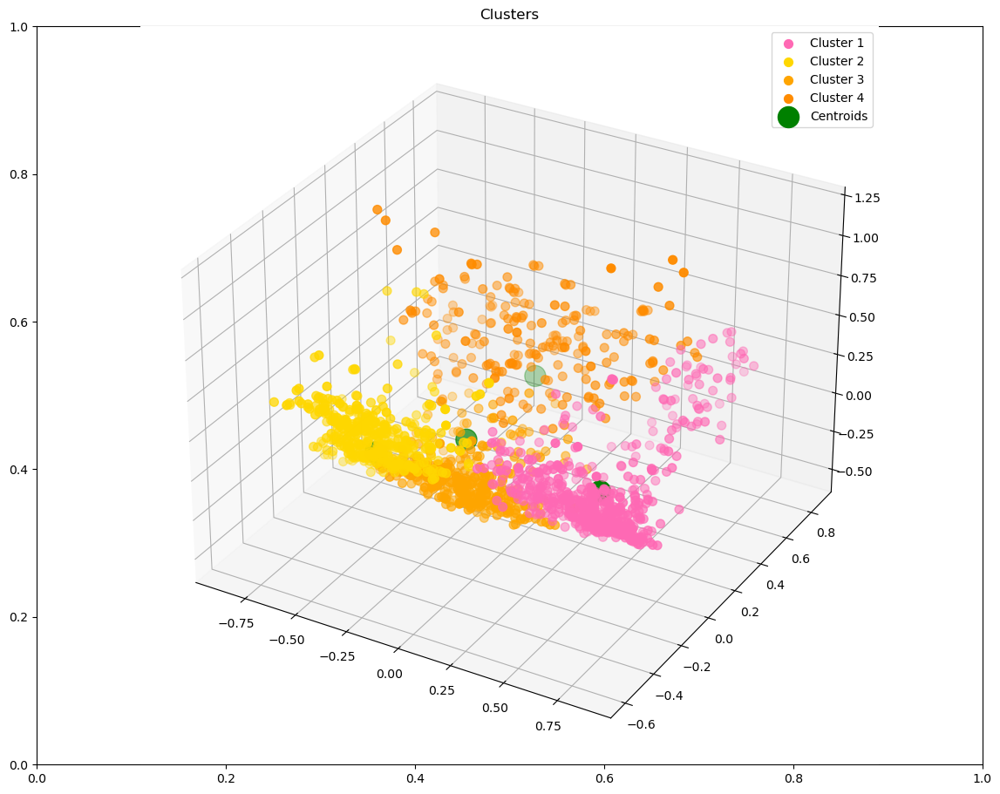

In [60]:
plot_cluster_3d(result_arr,kmeans,y_kmeans,4)

In [61]:
def plot_cluster_2d(df,model):
    # visualize clusters on principle components
    plt.title('K-Means Clustering Results w/ K=2')
    plt.scatter(df[:,0], df[:,1], s=40, c=model.labels_, cmap=plt.cm.prism)
    plt.scatter(model.cluster_centers_[:,0], model.cluster_centers_[:,1], marker='*', s=400, c='k', linewidth=2)
    
    plt.gcf().set_size_inches(18.5, 10.5)

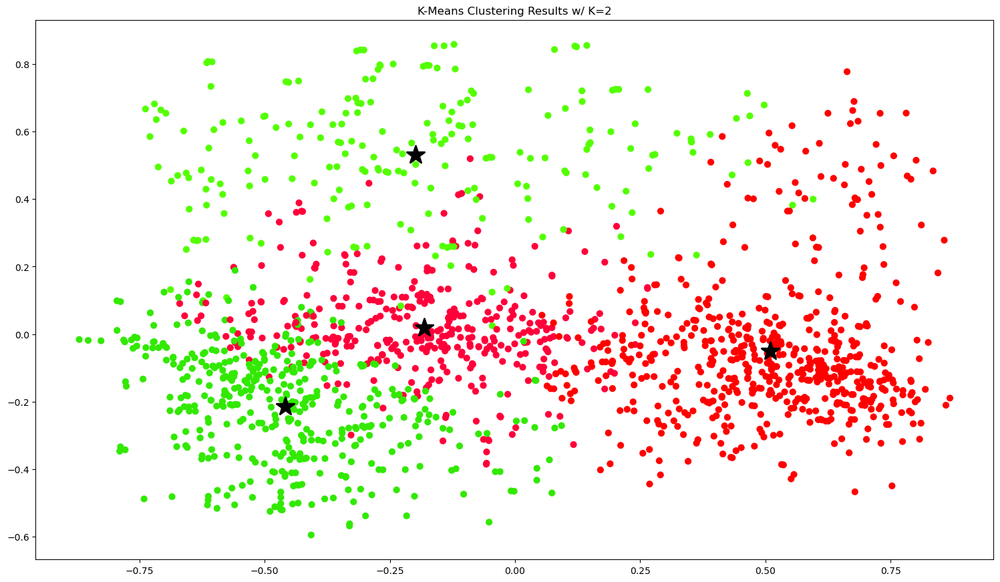

In [62]:
plot_cluster_2d(result_arr,kmeans)

In [63]:
song_dat=pd.read_csv("rolling_stones_spotify.csv")
song_dat_cluster=song_dat.copy()

In [64]:
song_dat_cluster['cluster']=y_kmeans

In [65]:
song_dat_cluster.head()

,Unnamed: 0,name,album,release_date,track_number,id,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms,cluster
0,0,Concert Intro Music - Live,Licked Live In NYC,2022-06-10,1,2IEkywLJ4ykbhi1yRQvmsT,spotify:track:2IEkywLJ4ykbhi1yRQvmsT,0.0824,0.463,0.993,0.996000,0.932,-12.913,0.1100,118.001,0.0302,33,48640,0
1,1,Street Fighting Man - Live,Licked Live In NYC,2022-06-10,2,6GVgVJBKkGJoRfarYRvGTU,spotify:track:6GVgVJBKkGJoRfarYRvGTU,0.4370,0.326,0.965,0.233000,0.961,-4.803,0.0759,131.455,0.3180,34,253173,0
2,2,Start Me Up - Live,Licked Live In NYC,2022-06-10,3,1Lu761pZ0dBTGpzxaQoZNW,spotify:track:1Lu761pZ0dBTGpzxaQoZNW,0.4160,0.386,0.969,0.400000,0.956,-4.936,0.1150,130.066,0.3130,34,263160,0
3,3,If You Can't Rock Me - Live,Licked Live In NYC,2022-06-10,4,1agTQzOTUnGNggyckEqiDH,spotify:track:1agTQzOTUnGNggyckEqiDH,0.5670,0.369,0.985,0.000107,0.895,-5.535,0.1930,132.994,0.1470,32,305880,0
4,4,Don’t Stop - Live,Licked Live In NYC,2022-06-10,5,7piGJR8YndQBQWVXv6KtQw,spotify:track:7piGJR8YndQBQWVXv6KtQw,0.4000,0.303,0.969,0.055900,0.966,-5.098,0.0930,130.533,0.2060,32,305106,0


In [66]:
px.scatter_3d(song_dat_cluster,x='danceability',y='energy',z='tempo',color='cluster')

In [67]:
# popularity mean by cluster
song_dat_cluster.groupby(['cluster']).popularity.mean().sort_values(ascending=False)

cluster
2    24.768421
1    21.634204
3    20.672986
0    17.704013
Name: popularity, dtype: float64

In [68]:
# checking number of songs in each cluster
song_dat_cluster['cluster'].value_counts()

cluster
0    598
1    421
2    380
3    211
Name: count, dtype: int64

In [69]:
# Select only numeric columns and the 'cluster' column
song_dat_df = song_dat_cluster.select_dtypes(include='number').copy()
song_dat_df['cluster'] = song_dat_cluster['cluster']  # Ensure 'cluster' is included

# Group by 'cluster' and calculate the mean of each numeric column
cluster_summary = song_dat_df.groupby('cluster').mean()
print(cluster_summary)

          Unnamed: 0  track_number  acousticness  danceability    energy  \
cluster                                                                    
0         467.591973     10.371237      0.213431      0.375446  0.902522   
1        1237.883610      7.099762      0.375103      0.530005  0.584264   
2         735.786842      8.034211      0.148108      0.528316  0.847045   
3        1018.374408      7.696682      0.291152      0.504526  0.796810   

         instrumentalness  liveness  loudness  speechiness       tempo  \
cluster                                                                  
0                0.114033  0.884962 -5.649995     0.097885  130.405987   
1                0.035830  0.206332 -9.710675     0.047765  120.018385   
2                0.067470  0.249141 -5.739339     0.057046  128.247016   
3                0.736488  0.383594 -7.471374     0.054944  122.026953   

          valence  popularity    duration_ms  
cluster                                       
0   

In [70]:
# Checking which cluster was most popular
song_dat_cluster.groupby('cluster')['popularity'].mean().sort_values(ascending=False)

cluster
2    24.768421
1    21.634204
3    20.672986
0    17.704013
Name: popularity, dtype: float64

In [71]:
# Checking the song for cluster 2 as it has the highly most popular song
song_dat_cluster.loc[song_dat_cluster['cluster'] == 2].head()

## Start me Up - remastered 2021 is most popular

,Unnamed: 0,name,album,release_date,track_number,id,uri,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,duration_ms,cluster
46,46,Start Me Up - Remastered 2021,Tattoo You (Super Deluxe),2021-10-22,1,0QT1jprS8mepNiTNvdVblv,spotify:track:0QT1jprS8mepNiTNvdVblv,0.0302,0.555,0.956,0.367000,0.0753,-2.147,0.0577,121.752,0.933,39,214173,2
47,47,Hang Fire - Remastered 2021,Tattoo You (Super Deluxe),2021-10-22,2,0fcw78KJ56avczitNUdmB2,spotify:track:0fcw78KJ56avczitNUdmB2,0.0136,0.421,0.927,0.079700,0.2640,-1.734,0.0345,151.096,0.922,29,141626,2
48,48,Slave - Remastered 2021,Tattoo You (Super Deluxe),2021-10-22,3,7CYbtT5BeRAVJnkJwgEBcu,spotify:track:7CYbtT5BeRAVJnkJwgEBcu,0.1300,0.558,0.898,0.306000,0.0562,-4.314,0.0515,133.338,0.853,29,392426,2
51,51,Neighbours - Remastered 2021,Tattoo You (Super Deluxe),2021-10-22,6,0TatWEWIZ3iT65ltkxn6w3,spotify:track:0TatWEWIZ3iT65ltkxn6w3,0.0754,0.479,0.981,0.005630,0.2450,-1.712,0.0710,82.412,0.671,24,214306,2
52,52,Worried About You - Remastered 2021,Tattoo You (Super Deluxe),2021-10-22,7,0Vb7dqiZ89IQngeX52jLaO,spotify:track:0Vb7dqiZ89IQngeX52jLaO,0.0804,0.423,0.714,0.000517,0.0820,-4.010,0.0318,84.351,0.383,26,318253,2


In [72]:
song_dat_cluster.iloc[:,6:].columns

Index(['uri', 'acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity',
       'duration_ms', 'cluster'],
      dtype='object')

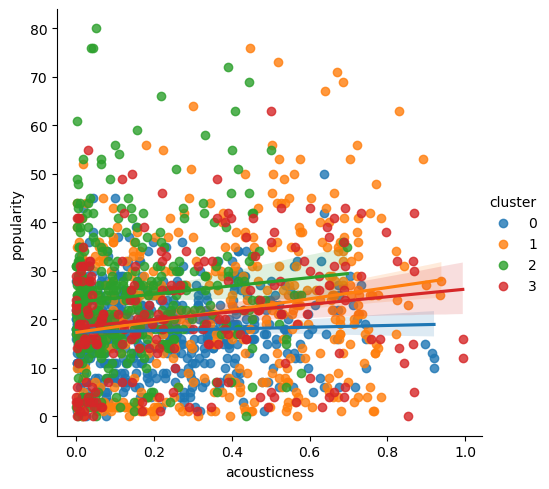

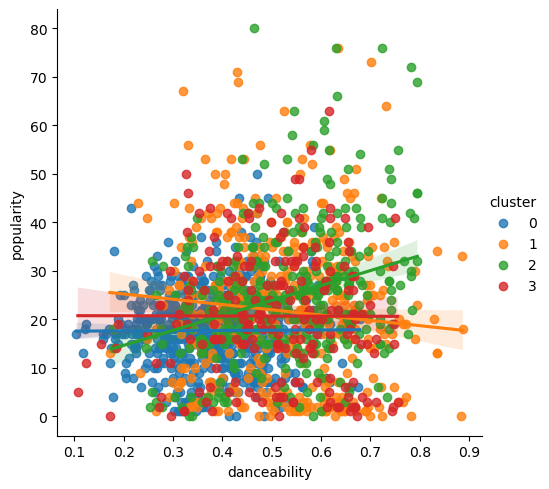

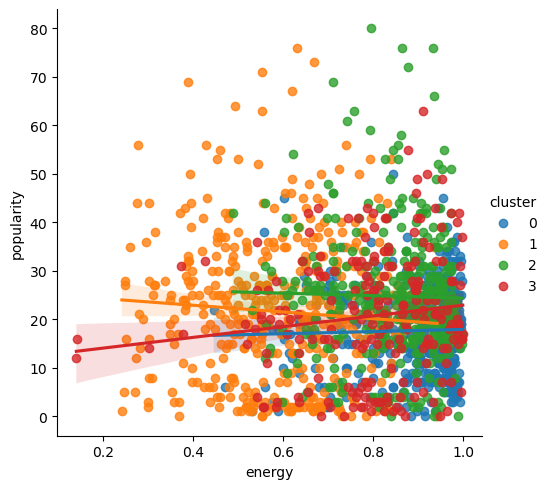

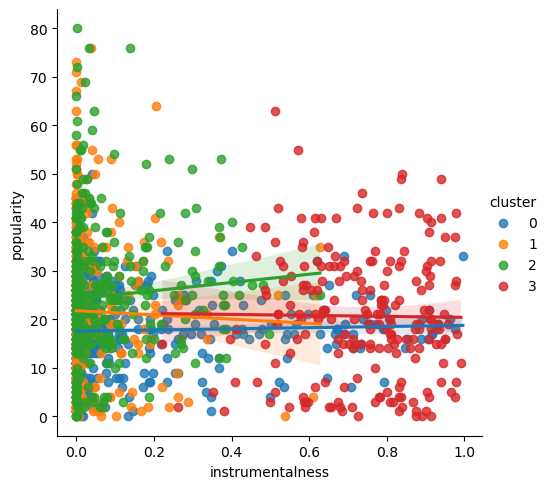

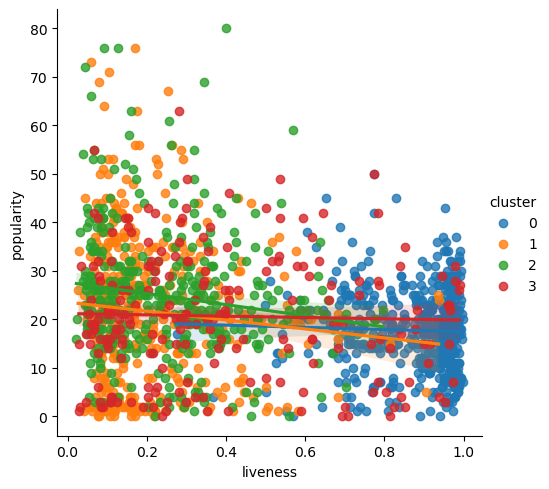

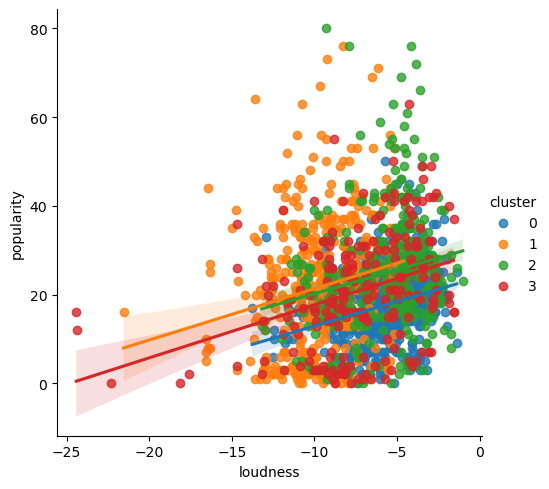

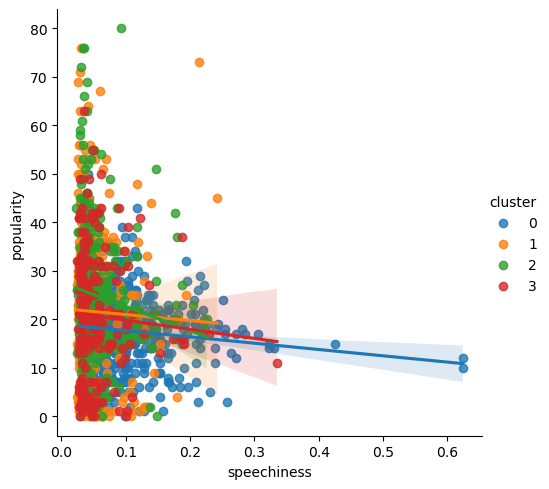

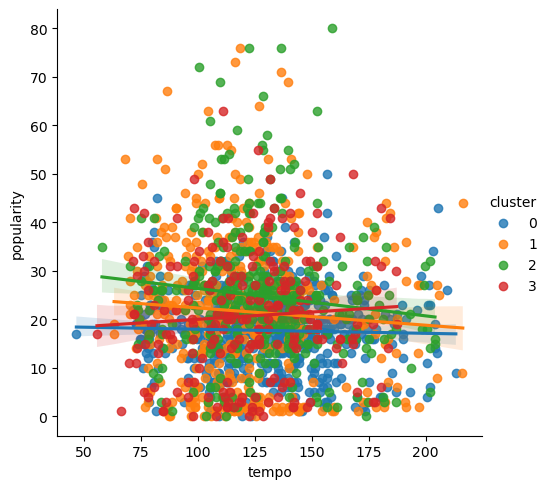

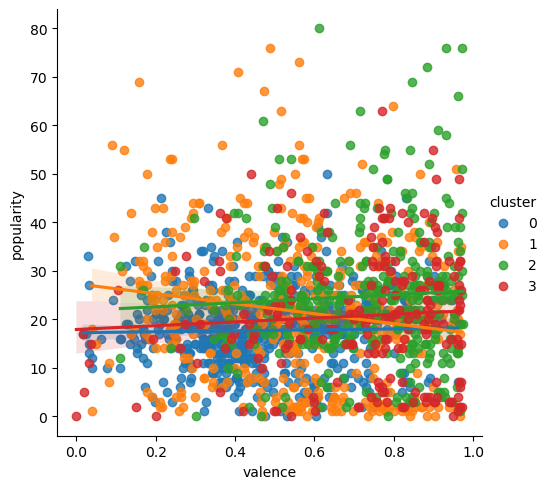

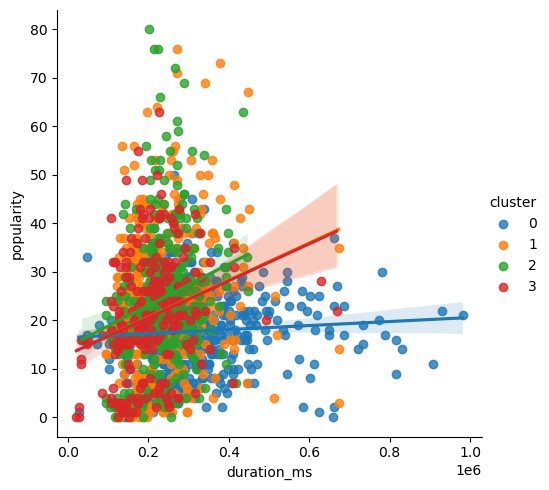

<Figure size 640x480 with 0 Axes>

In [73]:
for col in ['acousticness', 'danceability', 'energy', 'instrumentalness','liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms']:
    sns.lmplot(data=song_dat_cluster,x=col,y='popularity',hue='cluster');
    plt.show()
plt.tight_layout()

## Some imp findings
- Most popular song in Cluster 2
- Cluster 2 has high danceability, energy, tempo and valence songs